<a href="https://colab.research.google.com/github/smartinternz02/SI-GuidedProject-580142-1694601987/blob/main/Dog_vs_Cat_Predictionn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
#installing the Kaggle Library
!pip install kaggle

In [7]:
#configuring the path of kaggle json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [9]:
#Kaggle api
!kaggle competitions download -c dogs-vs-cats

 99% 805M/812M [00:10<00:00, 99.9MB/s]
100% 812M/812M [00:10<00:00, 78.0MB/s]


In [10]:
#extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/dogs-vs-cats.zip'
with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [11]:
#extracting the train.zip file
#this will give us thousands of images of dogs and cats
from zipfile import ZipFile

dataset = '/content/train.zip'
with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print("The dataset is extracted")

The dataset is extracted


In [12]:
import os
#counting the number of files in train folder
path, dirs, files = next(os.walk('/content/train'))
train_files = len(files)
print("number of images: " ,train_files)

number of images:  25000


In [13]:
#listdir = list all the files in the folder
file_names = os.listdir('/content/train')
print(file_names)

['cat.1953.jpg', 'dog.10579.jpg', 'dog.8628.jpg', 'cat.8093.jpg', 'cat.4780.jpg', 'dog.4675.jpg', 'dog.4733.jpg', 'dog.11132.jpg', 'dog.8344.jpg', 'cat.8488.jpg', 'cat.4494.jpg', 'cat.1059.jpg', 'dog.432.jpg', 'dog.3569.jpg', 'dog.10569.jpg', 'dog.5915.jpg', 'cat.6205.jpg', 'cat.10037.jpg', 'dog.2235.jpg', 'dog.5093.jpg', 'cat.1739.jpg', 'cat.10607.jpg', 'dog.7030.jpg', 'cat.6736.jpg', 'dog.8442.jpg', 'cat.11688.jpg', 'cat.2977.jpg', 'cat.4862.jpg', 'dog.6858.jpg', 'dog.3836.jpg', 'dog.8841.jpg', 'cat.600.jpg', 'dog.3011.jpg', 'dog.10689.jpg', 'dog.8424.jpg', 'dog.3881.jpg', 'dog.4974.jpg', 'cat.89.jpg', 'dog.10539.jpg', 'cat.10271.jpg', 'cat.2813.jpg', 'dog.3258.jpg', 'dog.7878.jpg', 'cat.11.jpg', 'dog.4833.jpg', 'cat.6781.jpg', 'dog.10061.jpg', 'cat.8971.jpg', 'cat.11643.jpg', 'cat.9362.jpg', 'dog.2798.jpg', 'cat.8666.jpg', 'dog.5130.jpg', 'cat.11269.jpg', 'cat.4776.jpg', 'dog.7903.jpg', 'cat.4336.jpg', 'cat.8544.jpg', 'dog.2965.jpg', 'dog.1359.jpg', 'dog.5221.jpg', 'dog.7822.jpg', '

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

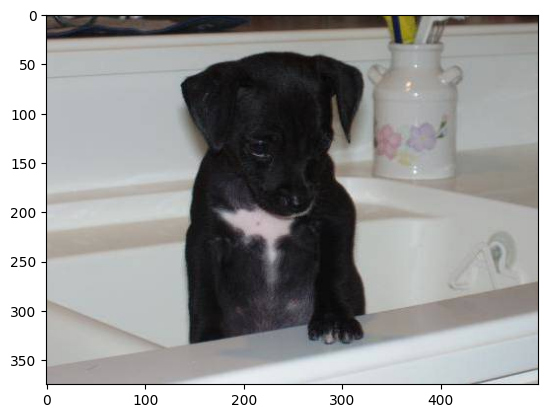

In [15]:
# display dog images
img = mpimg.imread('/content/train/dog.8298.jpg')
imgplt = plt.imshow(img)
plt.show()

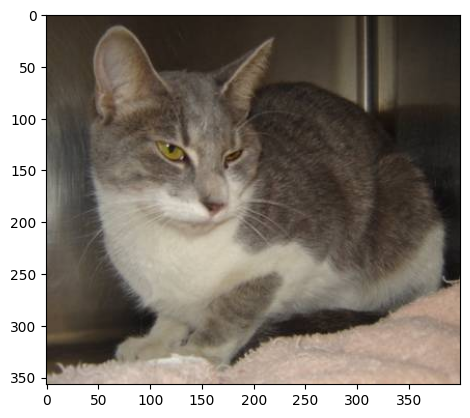

In [16]:
# display cat images
img = mpimg.imread('/content/train/cat.4352.jpg')
imgplt = plt.imshow(img)
plt.show()

In [17]:
#calculate the number of dog and cat images
file_names = os.listdir('/content/train')

dog_count = 0
cat_count = 0
for img_file in file_names:
  name = img_file[0:3]
  if name == 'dog':
    dog_count += 1
  elif name == 'cat':
    cat_count += 1

print("Number of dog images: ", dog_count)
print("Number of cat images: ", cat_count)

Number of dog images:  12500
Number of cat images:  12500


In [18]:
#creating a directory for resized images
#mkdir = make directory
import os

if not os.path.exists('/content/image_resized'):
    os.mkdir('/content/image_resized')
    print("Directory 'image_resized' created.")
else:
    print("Directory 'image_resized' already exists.")

Directory 'image_resized' created.


In [19]:
original_folder = '/content/train/'
resized_folder = '/content/image_resized/'

for i in range(2000):
  file_name = os.listdir(original_folder)[i]
  img_file = original_folder + file_name

  # open the image and resize it
  img = Image.open(img_file)
  img = img.resize((224, 224))
  img = img.convert('RGB')

  newImgPath = resized_folder + file_name
  img.save(newImgPath)

In [20]:
# Check if the file exists
file_path = '/content/image_resized/cat.4352.jpg'
if os.path.exists(file_path):
    print("The file exists.")
else:
    print("The file does not exist.")

The file does not exist.


In [21]:
from PIL import Image
import os

original_folder = '/content/train/'
resized_folder = '/content/image_resized/'

for i in range(2000):
  file_name = os.listdir(original_folder)[i]
  img_file = original_folder + file_name

  # Check if the file is an image file (optional, but can prevent errors)
  if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
      try:
          # open the image and resize it
          img = Image.open(img_file)
          img = img.resize((224, 224))
          img = img.convert('RGB')  # Ensure RGB format

          newImgPath = resized_folder + file_name
          img.save(newImgPath)

      except Exception as e:
          print(f"Error processing {img_file}: {e}")

**Creating labels for resized images of dogs and cats**

Cat --> 0

Dog --> 1

In [22]:
#creating a loop to assign labels
filenames = os.listdir('/content/image_resized')
labels = []

for file in filenames:
  if file[0:3] == 'cat':
    labels.append(0)
  elif file[0:3] == 'dog':
    labels.append(1)

In [23]:
print (filenames[0:5])
print (labels[0:5])

['cat.1953.jpg', 'dog.10579.jpg', 'dog.8628.jpg', 'cat.8093.jpg', 'cat.4780.jpg']
[0, 1, 1, 0, 0]


In [24]:
# counting the images of dogs and cats out of 2000 images
print("Number of dog images: ", labels.count(1))
print("Number of cat images: ", labels.count(0))

Number of dog images:  1042
Number of cat images:  958


In [25]:
# counting the images of dogs and cats out of 2000 images
values, counts = np.unique(labels, return_counts=True)
print(values)
print(counts)

[0 1]
[ 958 1042]


Converting all resized images to numpy arrays

In [26]:
import cv2
import glob

In [27]:
image_directory = '/content/image_resized/'
image_extension = ['png', 'jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]

#taking and reading each file name in the files array and convert it to a numpy array
dog_cat_images = np.asarray([cv2.imread(file) for file in files])

In [28]:
print(dog_cat_images)

[[[[168 152 136]
   [236 220 204]
   [162 146 130]
   ...
   [198 227 242]
   [196 225 239]
   [193 222 236]]

  [[170 154 138]
   [234 218 202]
   [165 149 133]
   ...
   [198 227 242]
   [196 225 239]
   [194 223 237]]

  [[165 150 134]
   [225 210 194]
   [169 154 138]
   ...
   [199 228 243]
   [197 226 240]
   [194 223 237]]

  ...

  [[133 151 162]
   [133 151 162]
   [132 149 162]
   ...
   [196 222 236]
   [189 215 229]
   [190 216 230]]

  [[132 150 161]
   [133 151 162]
   [135 152 165]
   ...
   [194 220 234]
   [187 213 227]
   [192 218 232]]

  [[140 158 169]
   [142 160 171]
   [142 159 172]
   ...
   [191 217 231]
   [184 210 224]
   [192 218 232]]]


 [[[251 250 254]
   [251 250 254]
   [251 250 254]
   ...
   [241 242 246]
   [244 245 249]
   [249 250 254]]

  [[251 250 254]
   [249 248 252]
   [248 247 251]
   ...
   [234 235 239]
   [240 241 245]
   [246 247 251]]

  [[251 250 254]
   [248 247 251]
   [245 244 248]
   ...
   [227 228 232]
   [238 239 243]
   [246 247

In [29]:
print(dog_cat_images.shape)

(2000, 224, 224, 3)


In [30]:
X = dog_cat_images
Y = np.asarray(labels)

**Train Test Split**

In [31]:
#test size 0.2 means 20% of the data will be test data and 80% training data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [32]:
print(X.shape, X_train.shape, X_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


1600 --> training images

400 --> test images

In [33]:
#scaling the data
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255


In [34]:
print (X_train_scaled) #all values between 0 and 1[data scaled]

[[[[0.1372549  0.06666667 0.0627451 ]
   [0.15686275 0.08627451 0.08235294]
   [0.19607843 0.11764706 0.11372549]
   ...
   [0.33333333 0.23529412 0.01568627]
   [0.32941176 0.23921569 0.01960784]
   [0.32941176 0.23921569 0.01960784]]

  [[0.14901961 0.0745098  0.0627451 ]
   [0.15686275 0.08235294 0.07058824]
   [0.18431373 0.10196078 0.09411765]
   ...
   [0.33333333 0.23529412 0.01568627]
   [0.32941176 0.23921569 0.01960784]
   [0.32941176 0.23921569 0.01960784]]

  [[0.18823529 0.10980392 0.09019608]
   [0.18823529 0.10196078 0.08235294]
   [0.20392157 0.10980392 0.08627451]
   ...
   [0.33333333 0.23529412 0.01568627]
   [0.32941176 0.23921569 0.01960784]
   [0.32941176 0.23921569 0.01960784]]

  ...

  [[0.39607843 0.46666667 0.53333333]
   [0.39215686 0.4627451  0.52941176]
   [0.38823529 0.45882353 0.5254902 ]
   ...
   [0.47058824 0.3254902  0.23921569]
   [0.4745098  0.34117647 0.25098039]
   [0.48235294 0.34901961 0.25882353]]

  [[0.40784314 0.47843137 0.54509804]
   [0.4

**Building the Neural Network**

In [35]:
import kagglehub
import tensorflow as tf
import tensorflow_hub as hub

# Download latest version
mobilenet_model = kagglehub.model_download("google/mobilenet-v2/tensorFlow2/tf2-preview-feature-vector")

print("Path to model files:", mobilenet_model)


  0%|          | 0.00/1.10M [00:00<?, ?B/s]



100%|██████████| 5.15k/5.15k [00:00<00:00, 8.77MB/s]




  0%|          | 0.00/8.65M [00:00<?, ?B/s]

 12%|█▏        | 1.00M/8.65M [00:00<00:00, 8.38MB/s]
100%|██████████| 1.10M/1.10M [00:00<00:00, 4.71MB/s]


100%|██████████| 8.65M/8.65M [00:00<00:00, 38.9MB/s]

Path to model files: /root/.cache/kagglehub/models/google/mobilenet-v2/tensorFlow2/tf2-preview-feature-vector/4


In [36]:
pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224, 224, 3), trainable=False)

In [37]:
num_of_classes = 2 #dog and cat(no. of types of images)

model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Dense(num_of_classes)
])

In [38]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [39]:
model.fit(X_train_scaled, Y_train, epochs=5)

Epoch 1/5
50/50 [==============================] - 80s 2s/step - loss: 0.1786 - acc: 0.9312
Epoch 2/5
50/50 [==============================] - 67s 1s/step - loss: 0.0559 - acc: 0.9837
Epoch 3/5
50/50 [==============================] - 69s 1s/step - loss: 0.0417 - acc: 0.9906
Epoch 4/5
50/50 [==============================] - 67s 1s/step - loss: 0.0326 - acc: 0.9925
Epoch 5/5
50/50 [==============================] - 69s 1s/step - loss: 0.0260 - acc: 0.9937


In [40]:
score, acc = model.evaluate(X_test_scaled, Y_test)
print('Test score:', score)
print('Test accuracy:', acc)

13/13 [==============================] - 21s 1s/step - loss: 0.0435 - acc: 0.9825
Test score: 0.04350554943084717
Test accuracy: 0.9825000166893005


Predictive system

path of the image to be predicted: /content/cat_image.jpg


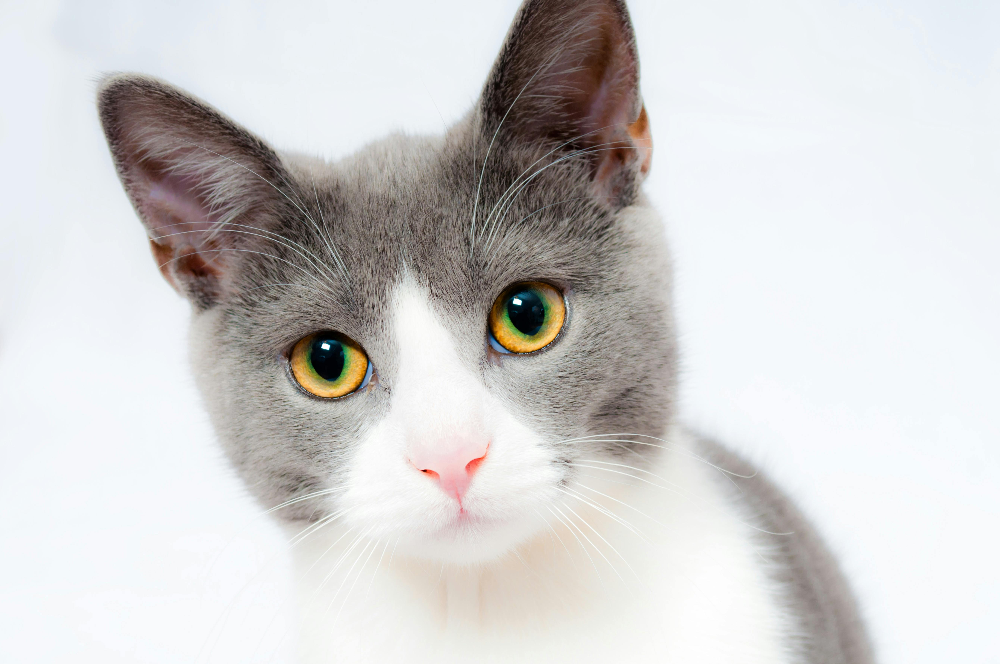

1/1 [==============================] - 0s 81ms/step
[[ 3.4035532 -5.6604605]]
0
The image is a cat


In [43]:
input_image_path = input("path of the image to be predicted: ")
input_image = cv2.imread(input_image_path)
cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224, 224))
input_image_scaled = input_image_resize / 255
image_reshaped = np.reshape(input_image_scaled, [1, 224, 224, 3]) # 1= no. of images to be inputted

input_prediction = model.predict(image_reshaped)
print(input_prediction)

input_pred_label = np.argmax(input_prediction)
print(input_pred_label)

if input_pred_label == 0:
  print("The image is a cat")
elif input_pred_label == 1:
  print("The image is a dog")
